# Prepare the environments for this set of experiments

In [1]:
import sys
sys.path.append('../../')
from panav.environment.env import Room, MultiTunnelEnv, WareHouse
from panav.viz import draw_env,draw_hybrid
from panav.hybrid import HybridGraph

from time import time
import pickle as pkl

%load_ext autoreload
%autoreload 2

/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/measurement.py:74: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


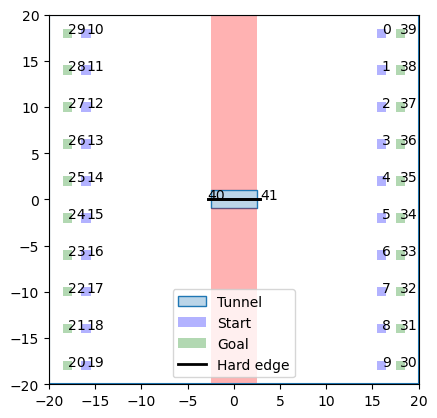

In [9]:
# Multi Tunnel
from panav.hybrid import MultiTunnelHG

bloating_r = 0.5

limits = [(-20,20),(-20,20)]
n_tunnel = 1

specs = dict(n_tunnel = n_tunnel, 
            tunnel_width = bloating_r*3.9,
            limits=limits,
            bloating_r = bloating_r)

HG = MultiTunnelHG(**specs, 
                   N_agent=20)
draw_hybrid(HG,
            display_node=True)

In [10]:
from panav.sequential import sequential_HybridSIPP
plans = sequential_HybridSIPP(HG)

0
1
2
3
4
5
6
7
8
9
10


/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/cvxpy/problems/problem.py:1391: UserWarning: 
    The problem is either infeasible or unbounded, but the solver
    cannot tell which. Disable any solver-specific presolve methods
    and re-solve to determine the precise problem status.

    For GUROBI and CPLEX you can automatically perform this re-solve
    with the keyword argument prob.solve(reoptimize=True, ...).
    
  warnings.warn(INF_OR_UNB_MESSAGE)


11
12
13
14
15
16
17
MILP low-level encounters infeasibility.
18
MILP low-level encounters infeasibility.
MILP low-level encounters infeasibility.
19
MILP low-level encounters infeasibility.
MILP low-level encounters infeasibility.
MILP low-level encounters infeasibility.


In [13]:
from matplotlib import pyplot as plt
from panav.viz import animation
from IPython.display import HTML, display
from matplotlib import rcParams
from panav.util import interpolate_positions


exec_tau = 0.25

rcParams['animation.embed_limit'] = 2**128
dt = exec_tau 
agents = range(len(plans))
pos_to_ani = []

for cp in plans:
    _,xs = interpolate_positions(*cp,dt)
    pos_to_ani.append(xs)
    
anim = animation(HG.env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 

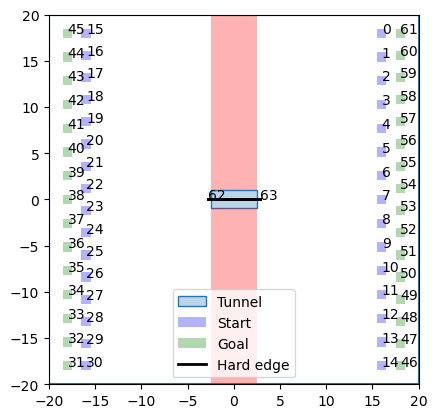

In [11]:
# Single Tunnel
from panav.hybrid import MultiTunnelHG

bloating_r = 0.5

n_agents = list(range(1,41,10))
limits = [(-20,20),(-20,20)]
n_tunnel = 1

specs = dict(n_tunnel = n_tunnel, 
            tunnel_width = bloating_r*3.9,
            limits=limits,
            bloating_r = bloating_r)

HG = MultiTunnelHG(**specs, 
                   N_agent=max(n_agents))
draw_hybrid(HG,
            display_node=True)


env_info = {'specs':specs,'constructor':MultiTunnelHG}
env_name = 'SingleTunnel'
with open('./envs/{}.pkl'.format(env_name),'wb') as f:
    pkl.dump(env_info,f)

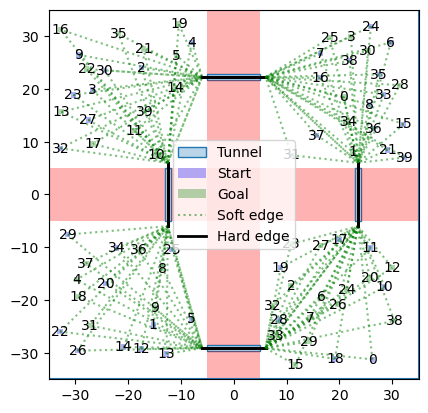

In [52]:
from matplotlib import pyplot as plt
from panav.hybrid import RoomHGBuilder
# Room Simplified


n_agents = list(range(1,41,10))
bloating_r = 0.5

specs = dict(n_col = 2, 
        n_row= 2, 
        cell_width=30,
        cell_height=30,
        wallthickness = 10,
        gap_width=2.5*bloating_r,
        start_goal_dist=50,
        bloating_r=bloating_r)

HG = RoomHGBuilder(**specs, N_agent=40)
draw_hybrid(HG,display_soft=True,show_agent_ID=True,display_node=False)

env_info = {'specs':specs,'constructor':RoomHGBuilder}
env_name = 'Room'
with open('./envs/{}.pkl'.format(env_name),'wb') as f:
    pkl.dump(env_info,f)

/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/measurement.py:74: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/Users/tianpengzhang/opt/miniconda3/envs/PA-NAV/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


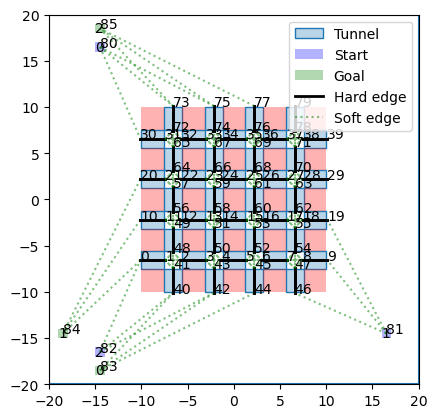

In [26]:
from panav.hybrid import WareHouseHGBuilder
# Warehouse
n_agents = list(range(1,41,10))
limits = [(-20,20),(-20,20)]
bloating_r = 0.5


specs = dict(limits = limits, 
                shelf_region_x_limit=[-10,10], 
                shelf_region_y_limit=[-10,10],
                n_col = 5, n_row = 5 , 
                corner_padding_x=5,corner_padding_y=5,
                bloating_r = bloating_r,
                tunnel_endpoint_buffer = 0.05)

HG = WareHouseHGBuilder(**specs, N_agent =3)
draw_hybrid(HG,show_agent_ID=True,display_node=True,display_soft=True)


env_info = {'specs':specs,'constructor':WareHouseHGBuilder}
env_name = 'Warehouse'

with open('./envs/{}.pkl'.format(env_name),'wb') as f:
    pkl.dump(env_info,f)

In [28]:
from panav.sequential import sequential_HybridSIPP

sequential_HybridSIPP(HG)

0
v 80 t0 0 h 41.93448669808741
soft plan
soft plan
soft plan
v 73 t0 10.839946955589763 h 31.76954159248059
hard plan
v 72 t0 13.523946955589762 h 29.08554159248059
hard plan
soft plan
soft plan
soft plan
v 65 t0 15.583041902404979 h 27.379541592480585
hard plan
soft plan
soft plan
soft plan
v 64 t0 18.267041902404976 h 24.695541592480588
hard plan
soft plan
soft plan
soft plan
v 31 t0 14.376717733700742 h 28.585865761184834
hard plan
soft plan
soft plan
soft plan
v 65 t0 15.22948851181171 h 27.379541592480585
hard plan
soft plan
soft plan
soft plan
v 64 t0 17.913488511811707 h 24.695541592480588
hard plan
soft plan
soft plan
soft plan
v 21 t0 18.766259289922676 h 24.195865761184844
hard plan
soft plan
soft plan
soft plan
v 57 t0 19.619030068033645 h 22.98954159248059
hard plan
soft plan
soft plan
soft plan
v 56 t0 22.303030068033646 h 20.30554159248059
hard plan
soft plan
soft plan
soft plan
v 49 t0 24.362124919891357 h 18.59954159248059
hard plan
soft plan
soft plan
soft plan
v 48 t

KeyboardInterrupt: 